# Overview CAM Project

**Class Activation Maps (CAM)**

It has been observed that convolution units of various layers of a convolutional neural network act as an object detector even though no such prior about the location of the object is provided while training the network for a classification task. Even though convolution has this remarkable property, it is lost when we use a fully connected layer for the classification task. To avoid the use of a fully connected network some architectures like Network in Network(NiN) and GoogLeNet are fully convolutional neural networks.

Global Average Pooling (GAP) could be a widely used layer in these architectures. It is mainly used as a regulator to prevent overfitting while training. The authors of Learning Deep options for Discriminative Localization identified that by adjusting that associated design, they will extend the benefits of GAP and be able to retain their localization capability to the very last layer.Let's try to quickly perceive the procedure for generating GAP through the use of CAM.


The class activation map indicates the discriminant region within the image that CNN uses to classify that image into an specific class. For this approach, the network consists of ConvNet and simply before the Softmax layer (for multiclass classification), the global average poling (gap) is applied on the convolution feature maps. The output of this layer is used as features for a fully connected layer that produces the required classification output. Given this architecture, we will establish the importance of the image regions by projecting back the weights of the output layer into the convolution feature maps.



![picture](https://drive.google.com/uc?export=view&id=1va2W6Bd-mbSzdqZLnc_5bwTYnMv7-5YL)


## Data Processing

The first thing that was done was to clone the whole project's repository in order to use its files directly in colab.

In [ ]:
import sys
# For colab
IN_COLAB = 'google.colab' in sys.modules
if 'google.colab' in sys.modules:
    from google.colab import drive
    drive.mount('/content/gdrive')
    %cd /content/gdrive/MyDrive/IMT Atlantique/Deep Learning/AttentionMap/
    

Mounted at /content/gdrive
/content/gdrive/MyDrive/IMT Atlantique/Deep Learning/AttentionMap


In [ ]:
!git clone -l -s https://github.com/acheketa/pytorch-CAM.git 

Cloning into 'pytorch-CAM'...
remote: Enumerating objects: 84, done.
remote: Total 84 (delta 0), reused 0 (delta 0), pack-reused 84
Unpacking objects: 100% (84/84), done.


We copy the python code to the drive in /content/

In [ ]:
%cd /content

/content


In [ ]:
%cd /content/pytorch-CAM


/content/pytorch-CAM


What we did next was to extract the images with which the model will be trained and tested, these are images of dogs and cats that become part of a kaggle challenge.

In [ ]:
! pip install -q kaggle
from google.colab import files

files.upload()
! mkdir ~/.kaggle 
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets list

Saving kaggle.json to kaggle.json
ref                                                          title                                           size  lastUpdated          downloadCount  
-----------------------------------------------------------  ---------------------------------------------  -----  -------------------  -------------  
alexgude/california-traffic-collision-data-from-switrs       California Traffic Collision Data from SWITRS    1GB  2020-11-22 16:51:55           1607  
babyoda/women-entrepreneurship-and-labor-force               Women Entrepreneurship and Labor Force           1KB  2020-11-21 08:38:51           3786  
szymonjanowski/internet-articles-data-with-users-engagement  Internet news data with readers engagement       3MB  2020-11-21 17:09:57           1837  
sakshigoyal7/credit-card-customers                           Credit Card customers                          379KB  2020-11-19 07:38:44           7220  
imoore/2020-us-general-election-turnout-rates         

In [ ]:
!kaggle competitions download -c dogs-vs-cats

!mkdir result
! mkdir train
! unzip -q train.zip -d train
! mkdir test1
! unzip -q test1.zip -d test1

  0% 0.00/86.8k [00:00<?, ?B/s]
100% 86.8k/86.8k [00:00<00:00, 33.1MB/s]
100% 271M/271M [00:02<00:00, 124MB/s]
100% 271M/271M [00:02<00:00, 134MB/s]
 99% 540M/543M [00:02<00:00, 217MB/s]
100% 543M/543M [00:02<00:00, 195MB/s]


In [ ]:
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia
!unzip chest-xray-pneumonia.zip -d images

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: images/chest_xray/train/NORMAL/IM-0435-0001-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0435-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0437-0001-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0437-0001-0002.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0437-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0438-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0439-0001-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0439-0001-0002.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0439-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0440-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0441-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0442-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0444-0001.jpeg  
  inflating: images/chest_xray/train/NORMAL/IM-0445-0001.jpeg  
 

In [ ]:
import numpy as np
import os

lieu = '/content/pytorch-CAM/train/train/'
ldseg=np.array(os.listdir(lieu))

i = 0
for filename in ldseg: 
  if filename != 'cat' and filename != 'dog':
    
    dst =filename.split('.')[1] + '.jpg'
    src =lieu+ filename 
    dst =lieu+ filename.split('.')[0]+'/'+dst 
    os.rename(src, dst)
    #os.remove(lieu+filename) 
  i += 1

## Model CAM

In this project the Inception V3.0 model was used to implement CAM, then the necessary libraries and classes are imported.

In [ ]:
from update import *
from data import *
from train import *
import torch, os
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from inception import inception_v3
import numpy as np
import io
import requests
from PIL import Image
from torch.autograd import Variable
from torch.nn import functional as F
import cv2
from inception import inception_v3

Below are defined hyperparameters and the functions that will be used by default (1) or that can be used if desired (0).

In [ ]:
"""
Class Activation Mapping
Googlenet, Kaggle data
"""

# functions
CAM             = 1
USE_CUDA        = 1
RESUME          = 0
PRETRAINED      = 1


# hyperparameters
BATCH_SIZE      = 32
IMG_SIZE        = 224
LEARNING_RATE   = 0.01
EPOCH           = 2


Next, we define the methods that are going to normalize and transform the images inside the folder by:

In [ ]:
# prepare data
normalize = transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
)

transform_train = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    normalize
])

transform_test = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    normalize
])

 We load the data set folder and also transform the images inside the folder , after transforming the data, we load the dataset to the DataLoader. Also we define the classes of cat and dog.

In [ ]:
dataset = 1

if dataset == 0 :
  train_data = datasets.ImageFolder('/content/pytorch-CAM/train/train', transform=transform_train)
  trainloader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

  test_data = datasets.ImageFolder('/content/pytorch-CAM/test1', transform=transform_test)
  testloader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


  # class
  classes = {0: 'cat', 1: 'dog'}
else:
  train_data = datasets.ImageFolder('/content/pytorch-CAM/images/chest_xray/train', transform=transform_train)
  trainloader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

  test_data = datasets.ImageFolder('/content/pytorch-CAM/images/chest_xray/test', transform=transform_test)
  testloader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


  # class
  classes = {0: 'normal', 1: 'pneumonie'}

Next, we call the function inception where it has as a parameter to enter if it is pretrained or not, if it is, the function returns a pretrained model in ImageNet. As we are not using a pre-trained model, we call the function and enter the number of classes which in this case would be 2 (cat, dog).

In [ ]:
# fine tuning
if PRETRAINED:
    net = inception_v3(pretrained=PRETRAINED)
    for param in net.parameters():
        param.requires_grad = False
    net.fc = torch.nn.Linear(2048, 2)
else:
    net = inception_v3(pretrained=PRETRAINED, num_classes=len(classes))
final_conv = 'Mixed_7c'

net.cuda()

Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth


Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, t

It is possible to restart the training from a desired point as shown below, simply modify RESUME and define from which point you want to resume, the checkpoints are stored in a text file that generates the algorithm.

In [ ]:
# load checkpoint
if RESUME != 0:
    print("===> Resuming from checkpoint.")
    assert os.path.isfile('checkpoint/'+ str(RESUME) + '.pt'), 'Error: no checkpoint found!'
    net.load_state_dict(torch.load('checkpoint/' + str(RESUME) + '.pt'))


It defines our optimizer that will be the SGD (Stochastic gradient descent), and the parameters to be used depending on whether the model is pretrained or not, also it is defined the criterion, is used the CrossEntropyLoss.

In [ ]:
# retrain
criterion = torch.nn.CrossEntropyLoss()

if PRETRAINED:
    optimizer = torch.optim.SGD(net.fc.parameters(), lr=LEARNING_RATE, momentum=0.9, weight_decay=5e-4)
    print("test1")
else:
    optimizer = torch.optim.SGD(net.parameters(), lr=LEARNING_RATE, momentum=0.9, weight_decay=5e-4)
    print("test")


test1


Retrain and retest classes are called in each iteration which are responsible for training and testing, their documentation is below.

In [ ]:
%cd /content/pytorch-CAM

/content/pytorch-CAM


In [ ]:
#Test wit cats-dogs Dataset

for epoch in range (1, EPOCH + 1):
    print("test")
    retrain(trainloader, net, USE_CUDA, epoch, criterion, optimizer)
    retest(testloader, net, USE_CUDA, criterion, epoch, RESUME)

One of the objectives of CAM is to perform a correct classification with only one forward, this task is performed correctly however when training the network its accuracy is still very low, for this reason when performing some more iterations the model improves .

It can be observed that with 5 iterations a training accuracy (81.636%) was obtained, and (68.590%) with the testing dataset.

In [ ]:
#Test wit chest x-ray Dataset

for epoch in range (1, EPOCH + 1):
    print("test")
    retrain(trainloader, net, USE_CUDA, epoch, criterion, optimizer)
    retest(testloader, net, USE_CUDA, criterion, epoch, RESUME)

test
Train Epoch: 1 [0/5216 (0%)]	Loss: 0.338	Training Accuracy: 87.500%
Train Epoch: 1 [320/5216 (6%)]	Loss: 0.765	Training Accuracy: 80.682%
Train Epoch: 1 [640/5216 (12%)]	Loss: 0.464	Training Accuracy: 80.208%
Train Epoch: 1 [960/5216 (18%)]	Loss: 0.519	Training Accuracy: 81.351%
Train Epoch: 1 [1280/5216 (25%)]	Loss: 0.502	Training Accuracy: 80.793%
Train Epoch: 1 [1600/5216 (31%)]	Loss: 0.600	Training Accuracy: 80.331%
Train Epoch: 1 [1920/5216 (37%)]	Loss: 0.328	Training Accuracy: 80.328%
Train Epoch: 1 [2240/5216 (43%)]	Loss: 0.214	Training Accuracy: 80.590%
Train Epoch: 1 [2560/5216 (49%)]	Loss: 0.289	Training Accuracy: 80.556%
Train Epoch: 1 [2880/5216 (55%)]	Loss: 0.656	Training Accuracy: 79.945%
Train Epoch: 1 [3200/5216 (61%)]	Loss: 0.493	Training Accuracy: 79.889%
Train Epoch: 1 [3520/5216 (67%)]	Loss: 0.138	Training Accuracy: 80.265%
Train Epoch: 1 [3840/5216 (74%)]	Loss: 0.545	Training Accuracy: 80.139%
Train Epoch: 1 [4160/5216 (80%)]	Loss: 0.362	Training Accuracy: 80.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  



Test set: Average loss: 0.0137, Accuracy: 507/624 (81.250%)

test
Train Epoch: 2 [0/5216 (0%)]	Loss: 0.384	Training Accuracy: 78.125%
Train Epoch: 2 [320/5216 (6%)]	Loss: 0.640	Training Accuracy: 82.102%
Train Epoch: 2 [640/5216 (12%)]	Loss: 0.787	Training Accuracy: 81.696%
Train Epoch: 2 [960/5216 (18%)]	Loss: 0.279	Training Accuracy: 82.560%
Train Epoch: 2 [1280/5216 (25%)]	Loss: 0.541	Training Accuracy: 81.326%
Train Epoch: 2 [1600/5216 (31%)]	Loss: 0.468	Training Accuracy: 80.882%
Train Epoch: 2 [1920/5216 (37%)]	Loss: 0.425	Training Accuracy: 81.455%
Train Epoch: 2 [2240/5216 (43%)]	Loss: 0.231	Training Accuracy: 81.470%
Train Epoch: 2 [2560/5216 (49%)]	Loss: 0.323	Training Accuracy: 81.559%
Train Epoch: 2 [2880/5216 (55%)]	Loss: 0.397	Training Accuracy: 81.250%
Train Epoch: 2 [3200/5216 (61%)]	Loss: 0.396	Training Accuracy: 81.528%
Train Epoch: 2 [3520/5216 (67%)]	Loss: 0.370	Training Accuracy: 81.644%
Train Epoch: 2 [3840/5216 (74%)]	Loss: 0.352	Training Accuracy: 81.405%
Train

It can be observed that with 5 iterations a training accuracy (81.636%) was obtained, and (68.590%) with the testing dataset.

Next, we extract features of an image from a trained model, specifically in the last convolutional layer.

In [ ]:
# hook the feature extractor
features_blobs = []

def hook_feature(module, input, output):
    features_blobs.append(output.data.cpu().numpy())

net._modules.get(final_conv).register_forward_hook(hook_feature)


## **Update**

In [ ]:
def returnCAM(feature_conv, weight_softmax, class_idx):
    size_upsample = (256, 256)
    bz, nc, h, w = feature_conv.shape
    output_cam = []
    for idx in class_idx:
        cam = weight_softmax[class_idx].dot(feature_conv.reshape((nc, h*w))) #On recupère les poids du softmax pour l'indice de notre classe prédite pour chaques pixels
        cam = cam.reshape(h, w)
        cam = cam - np.min(cam)
        cam_img = cam / np.max(cam) #On veut des valeurs allant de 0 à 1
        cam_img = np.uint8(255 * cam_img) #Le système rgb fonctionne pour des valeurs allant de 0 à 255
        output_cam.append(cv2.resize(cam_img, size_upsample)) #On combine l'image et la carte d'activation
    return output_cam

This function generates an image showing the activation map for an image, a class and the input softmax weights, the goal is to see on which parts of the image the algorithm is based to give its final prediction.

In [ ]:
def get_cam(net, features_blobs, img_pil, classes, root_img):
    #On récupère les paramètres de notre réseau et des filtres utilisés
    params = list(net.parameters())
    weight_softmax = np.squeeze(params[-2].data.cpu().numpy())

    normalize = transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        normalize
    ])

    #L'image est pré-traitée puis envoyée à notre reseau de neurone
    img_tensor = preprocess(img_pil)
    img_variable = Variable(img_tensor.unsqueeze(0)).cuda()
    logit = net(img_variable)

    #On applique un softmax au résultat de notre réseau puis on récupère les probabilités pour chaques classes
    h_x = F.softmax(logit, dim=1).data.squeeze()
    probs, idx = h_x.sort(0, True)

    #Quelle est la classe la plus probable ?
    for i in range(0, 2):
        line = '{:.3f} -> {}'.format(probs[i], classes[idx[i].item()])
        print(line)

    #On superpose l'image et la carte d'activation du réseau pour cette image
    CAMs = returnCAM(features_blobs[0], weight_softmax, [idx[0].item()])

    #On affiche l'image générée
    print('output CAM.jpg for the top1 prediction: %s' % classes[idx[0].item()])
    img = cv2.imread(root_img)
    height, width, _ = img.shape
    CAM = cv2.resize(CAMs[0], (width, height))
    heatmap = cv2.applyColorMap(CAM, cv2.COLORMAP_JET)
    result = heatmap * 0.3 + img * 0.5
    cv2.imwrite('cam.jpg', result)

The purpose of this function is to create an image overlaying an image and the activation card returned by our neural network for the most probable class. To do this, we send our image to the network and then we recover the influence of each pixel of our image on this network in its final decision.

To create CAM, we need :

  Net => global average pooling => softmax


>$ f_{k} (x, y) => F_{k} = \sum_{x,y} f{k}(x, y) => S_{c} = \sum_{k}\omega _{k}^{c}F_{k} = \sum_{x,y}\sum_{k}\omega _{k}^{c}f_{k}(x, y) = \sum_{x,y}M_{c}(x,y)$ 

>$f_{k} (x, y) $ is the activation of unit k at (x,y) 

>$ \omega _{k}^{c} $ is the importance of $F_{k} $ for the class c

>$ M_{c}(x,y)$ gives the activation at (x,y) leading to the classification of our image

We normalize $M_{c}$ for the right class and we plot it on our image


## **Train**

In [ ]:
def retrain(trainloader, model, use_cuda, epoch, criterion, optimizer):

    #On met notre réseau en mode entrainement
    model.train()
    correct, total = 0, 0
    acc_sum, loss_sum = 0, 0
    i = 0

    #Pour toutes nos images d'entrainement, on va calculer les résultats du réseau puis le modifier en conséquence 
    for batch_idx, (data, target) in enumerate(trainloader):
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        data, target = Variable(data), Variable(target)
        optimizer.zero_grad()
        output = model(data)

        #On regarde si le réseau a eu la bonne prédiction pour calculer sa précision
        correct += (torch.max(output, 1)[1].view(target.size()).data == target.data).sum()
        total += trainloader.batch_size
        train_acc = 100. * correct / total
        acc_sum += train_acc
        i += 1

        #On calcule les pertes de notre réseau puis on fait du back-tracking pour optimiser ses paramètres internes
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        loss_sum += loss.item()

        #On affiche les résultats de l'entrainement en cours si on a parcouru 1/10 de notre partie du set d'entrainement
        if batch_idx % 10 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.3f}\tTraining Accuracy: {:.3f}%'.format(
                epoch, batch_idx * len(data), len(trainloader.dataset),
                100. * batch_idx / len(trainloader), loss.item(), train_acc))

    acc_avg = acc_sum / i
    loss_avg = loss_sum / len(trainloader.dataset)
    print()
    print('Train Epoch: {}\tAverage Loss: {:.3f}\tAverage Accuracy: {:.3f}%'.format(epoch, loss_avg, acc_avg))

    


This function trains the network if it has already been trained before. It takes the parameters already calculated and then runs through our training dataset dividing it into blocks. By calculating its losses, we can do backtracking so that the network improves its parameters as it goes along.

In [ ]:
def retest(testloader, model, use_cuda, criterion, epoch, RESUME):
    model.eval()
    test_loss = 0
    correct = 0
    for data, target in testloader:
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        data, target = Variable(data, volatile=True), Variable(target)
        output = model(data)
        # sum up batch loss
        test_loss += criterion(output, target).item()
        # get the index of the max log-probability
        pred = output.data.max(1, keepdim=True)[1]
        correct += pred.eq(target.data.view_as(pred)).cpu().sum()

    test_loss /= len(testloader.dataset)
    test_acc = 100. * correct / len(testloader.dataset)
    result = '\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.3f}%)\n'.format(
        test_loss, correct, len(testloader.dataset), test_acc)
    print(result)


This function follows the same process as the retrain function (just above) except that it does not use backtracking and does not change the neural network settings. The goal is only to compare the results of the network to the reality.

## **Data**

Les fonctions contenues dans le fichier data permettent de creer un data set a partir d'URL d'images.

In [ ]:
def read_data(img_num, txt, idx):
    f = open(txt, 'r')
    IMG_URLs = []
    for i in range(img_num):
        line = f.readline()
        url = line.split()[idx]
        IMG_URLs = np.append(IMG_URLs,url)
    f.close()
    return IMG_URLs

This function allows you to retrieve the individual URLs contained in a file and store them in a list.

In [ ]:
def get_img(num, IMG_URL, root):
    response = requests.get(IMG_URL)
    img_pil = Image.open(io.BytesIO(response.content))
    #img_pil.save(str(idx) + '.jpg')
    img_pil.save(root + str(num) + '.jpg')
    return img_pil

This function retrieves a list of URLs and uses them to retrieve images from a list.

## Experiments

Here we can observe how the image that has to be classified to identify whether it is a dog or a cat is entered into the model.

In [ ]:
# CAM classification cat
if CAM:
    root = '/content/pytorch-CAM/test1/test1/10001.jpg'
    img = Image.open(root)
    get_cam(net, features_blobs, img, classes, root)

1.000 -> cat
0.000 -> dog
output CAM.jpg for the top1 prediction: cat


In [ ]:
# CAM classification dog
if CAM:
    root = '/content/pytorch-CAM/test1/test1/10026.jpg'
    img = Image.open(root)
    get_cam(net, features_blobs, img, classes, root)

1.000 -> dog
0.000 -> cat
output CAM.jpg for the top1 prediction: dog


Here we can see how the classification is being done correctly between the dog and cat classes.

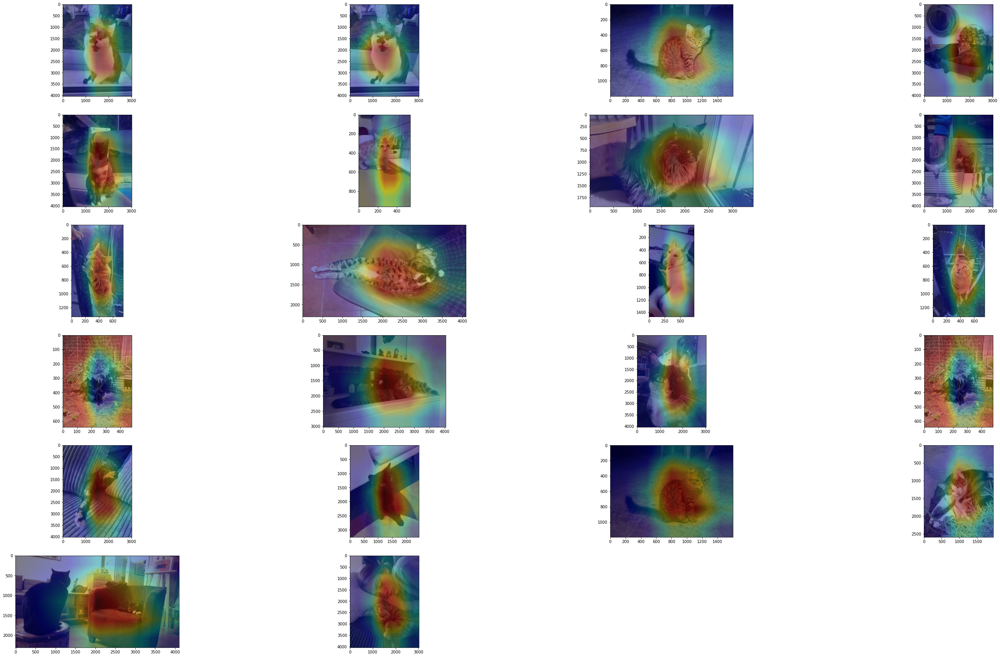

In [ ]:
import glob
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

images = []
images2 = []
path = '/content/gdrive/MyDrive/IMT Atlantique/Deep Learning/AttentionMap/Grad-CAM/pytorch-cnn-visualizations/results/resultsCAM/*.jpg'
path2 = '/content/gdrive/MyDrive/IMT Atlantique/Deep Learning/AttentionMap/Grad-CAM/pytorch-cnn-visualizations/results/resultsCAM/chest/*.jpg'
files = glob.glob(path)


for img_path in glob.glob(path):
      images.append(mpimg.imread(img_path))

for img_path2 in glob.glob(path2):    
    images2.append(mpimg.imread(img_path2))

plt.figure(figsize=(50,30))
columns = 4
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image) 

    



Here we can observe attention maps generated on the cat and dog class, the model is classifying correctly, we can observe the heat map.

When multiple instances of the same class are present in the image, the model looks only at one of them, is more difficult to classify when there are multiple objects, this may also be due  we have not adjusted the pre-trained alexnet model in our cat and dog dataset, CNN as a feature extractor is not at all familiar with the patterns of the images) that appear in our dataset.

In [ ]:
root = '/content/gdrive/MyDrive/IMT Atlantique/Deep Learning/AttentionMap/Grad-CAM/pytorch-cnn-visualizations/results/resultsCAM/chest/cam-2.jpg'
img = Image.open(root)
get_cam(net, features_blobs, img, classes, root)

1.000 -> pneumonie
0.000 -> normal
output CAM.jpg for the top1 prediction: pneumonie


We can see how the patient with pneumonia was correctly classified, then you can see the heat map generated.

0.928 -> pneumonie
0.072 -> normal
output CAM.jpg for the top1 prediction: pneumonie


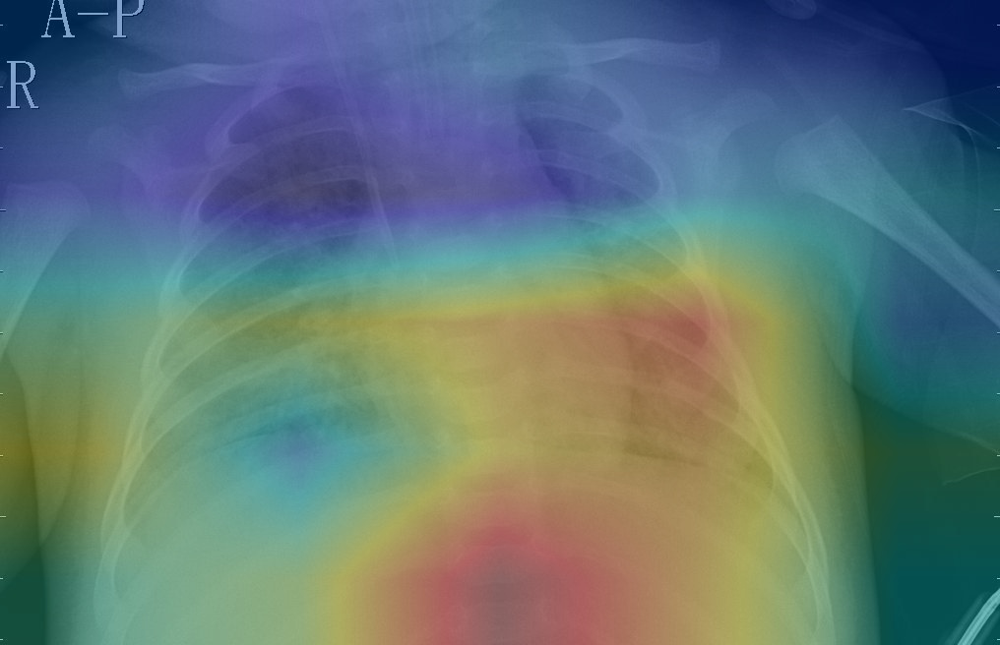

0.998 -> pneumonie
0.002 -> normal
output CAM.jpg for the top1 prediction: pneumonie


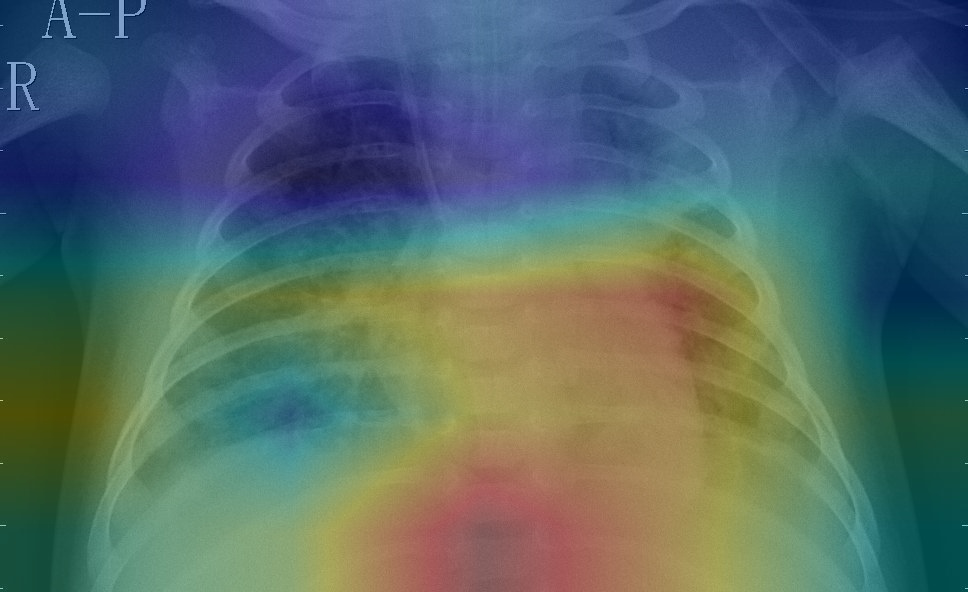

0.999 -> pneumonie
0.001 -> normal
output CAM.jpg for the top1 prediction: pneumonie


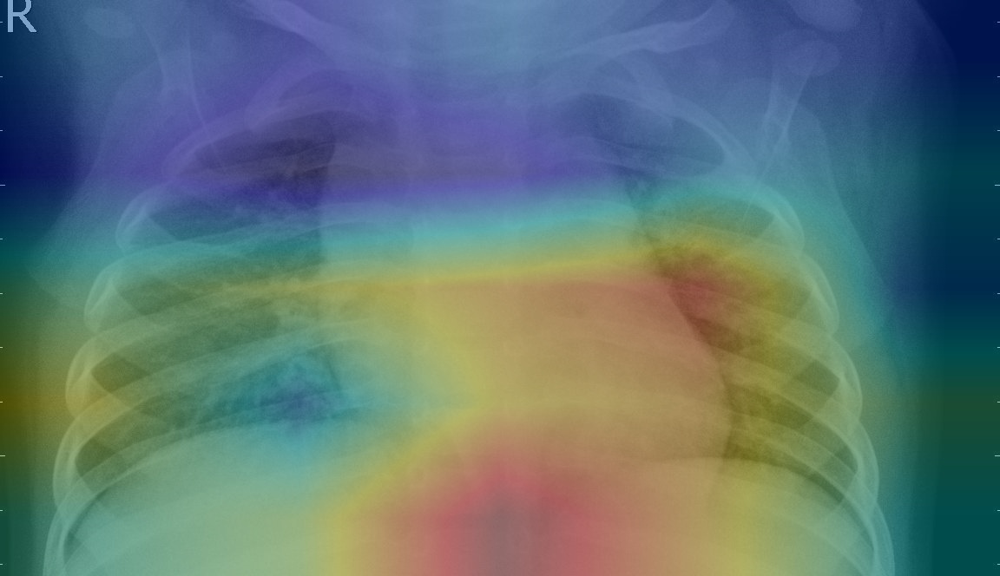

0.516 -> normal
0.484 -> pneumonie
output CAM.jpg for the top1 prediction: normal


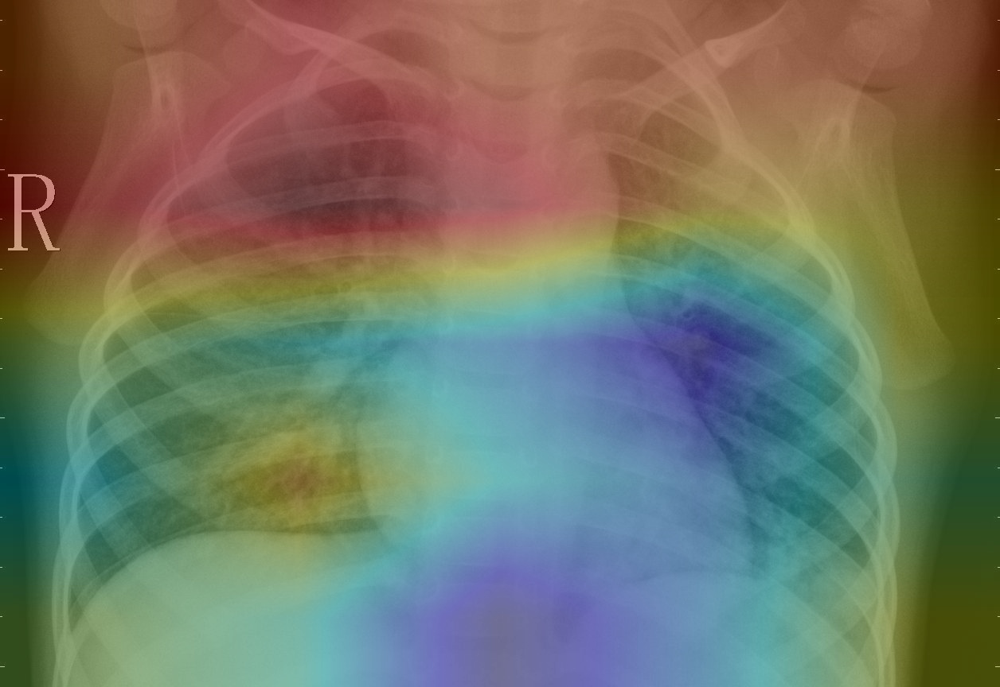

0.998 -> pneumonie
0.002 -> normal
output CAM.jpg for the top1 prediction: pneumonie


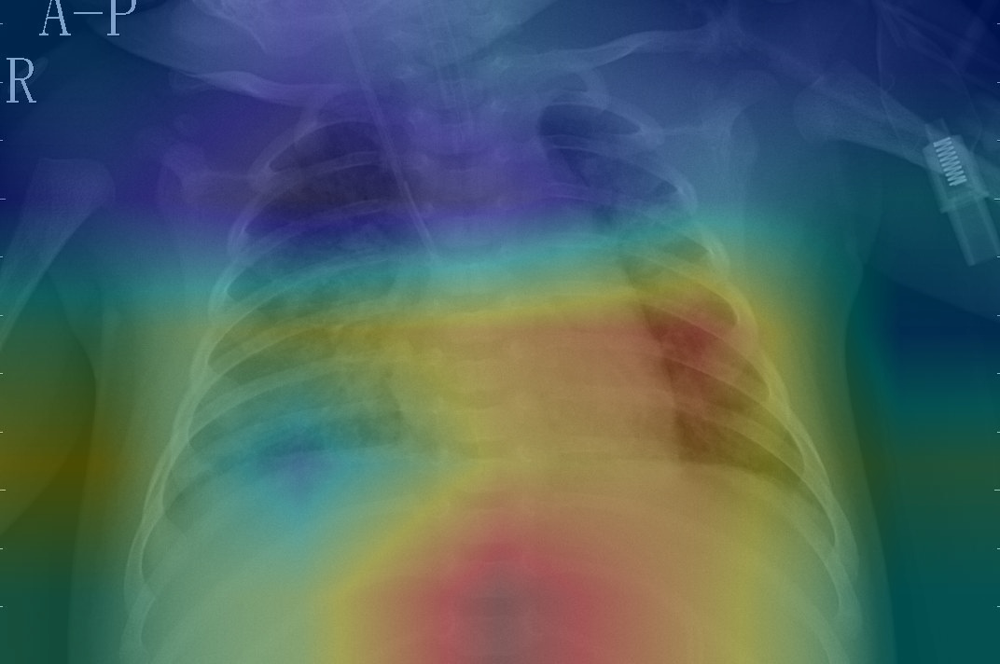

0.975 -> pneumonie
0.025 -> normal
output CAM.jpg for the top1 prediction: pneumonie


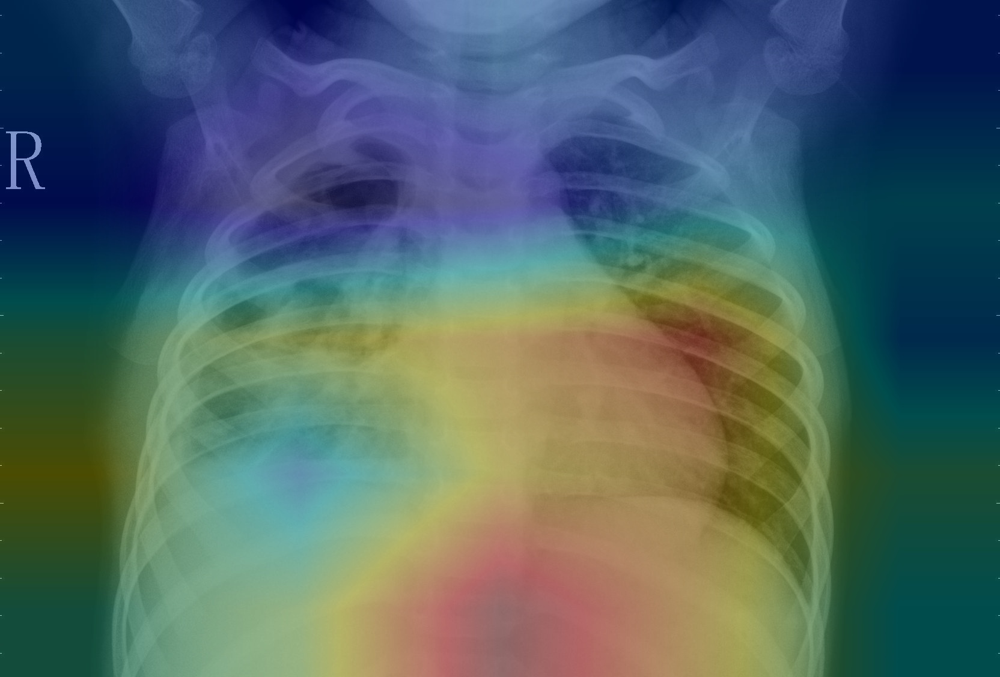

0.915 -> pneumonie
0.085 -> normal
output CAM.jpg for the top1 prediction: pneumonie


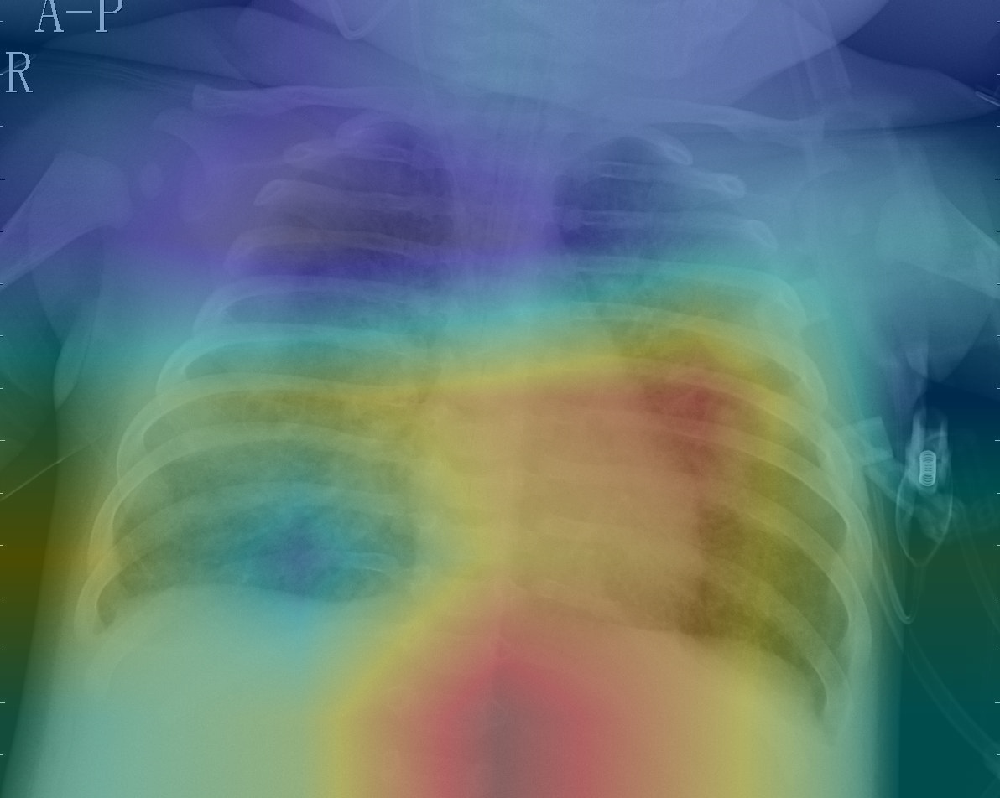

0.970 -> pneumonie
0.030 -> normal
output CAM.jpg for the top1 prediction: pneumonie


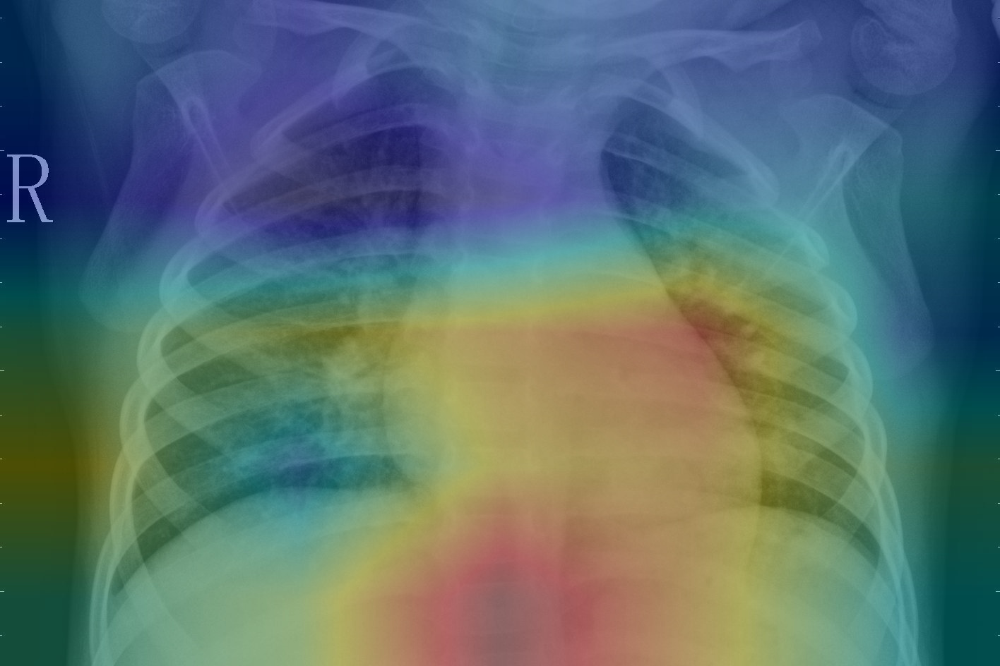

In [ ]:
lieu = '/content/pytorch-CAM/images/chest_xray/val/PNEUMONIA/'
ldseg=np.array(os.listdir(lieu))
i=0
for filename in ldseg: 
  root = lieu+filename
  img = Image.open(root)
  img_rgb = img.convert('RGB')
  get_cam(net, features_blobs, img_rgb, classes, root)

  pil_img = Image.open('/content/pytorch-CAM/cam.jpg')
  display(pil_img)

In [ ]:
lieu = '/content/pytorch-CAM/images/chest_xray/val/NORMAL/'
ldseg=np.array(os.listdir(lieu))
i=0
for filename in ldseg: 
  root = lieu+filename
  img = Image.open(root)
  img_rgb = img.convert('RGB')
  get_cam(net, features_blobs, img_rgb, classes, root)

  pil_img = Image.open('/content/pytorch-CAM/cam.jpg')
  display(pil_img)

In the image above we can see the X-ray with the pneumonia class activated and the zone were is activated.

# Grad-Cam Overview

Grad-CAM is a popular technique for visualizing where a convolutional neural network model is looking. Grad-CAM is class-specific, meaning it can produce a separate visualization for every class present in the image.

Grad-CAM can be used for weakly-supervised localization, for example determining the location of particular objects using a model that was trained only on whole-image labels rather than explicit location annotations.

Grad-CAM can also be used for weakly-supervised segmentation, in which the model predicts all of the pixels that belong to particular objects, without requiring pixel-level labels for training.

Grad-CAM is a Generalization of CAM. Grad-CAM does not require a particular CNN architecture. Grad-CAM is a generalization of CAM (class activation mapping), a method that does require using a particular architecture. CAM requires an architecture that applies global average pooling (GAP) to the final convolutional feature maps, followed by a single fully connected layer that produces the predictions.

![picture](https://drive.google.com/uc?export=view&id=1itTFZADlmWqXLxBnJnFeOYmILVBH86XQ)

The output of Grad-CAM is a class-discriminative localization map, this means a heatmap where the hot part corresponds to a particular class. 

To obtain the class-discriminative localization map, Grad-CAM computes the gradient of yc (score for class c) with respect to feature maps A of a convolutional layer, these gradients flowing back are global-average-pooled to obtain the importance weights αck.

It is important to note that y^c is the score for class c, so it is the output for class c before the softmax. This means that y^c is the raw neural network output for class c, before the softmax is applied to transform the raw score into a probability.

## Steps Grad-CAM

### Step 1 : Compute Gradient

For the first step it is necessary compute the gradient of y_c with respect to the feature map activations A^k of a convolutional layer. The particular value of the gradient calculated in this step depends on the input image chosen, because the input image determines the feature maps A^k as well as the final class score y^c that is produced. 

### Step 2 :  Calculate Alphas by Averaging Gradients

![picture](https://drive.google.com/uc?export=view&id=1ZJWr4Jv92nS_WssXOajX1b6npp4WHVj1 )

In this step, we usually calculate the alpha values. The alpha value for class c and the k-characteristic map that will be used in the next step as a weight applied to the A^k feature map. In CAM, the load applied to the A^k feature map is the weight w_k that is inside the fully connected end layer.

It is important to note that our gradients have form [k, v, u], so we should make groupings on the height v and therefore the width u so we have a vector of form [k, 1, 1] . These areas are the unit of our alpha k values.


### Step 3 :  Calculate Final Grad-CAM Heatmap

![picture](https://drive.google.com/uc?export=view&id=1zH4K4ff7y7Ly81sMT86Ruwnq1dd8ZW8h )

Now that we have our alpha values, each alpha value is used as the weight of the corresponding feature map, after this a weighted sum of feature maps is calculated as the final Grad-CAM heat map. Then a ReLU activation operation is applied to keep only the positive values and convert all negative values to 0.



![picture](https://drive.google.com/uc?export=view&id=1SkzUquzE9lMXyk77uKEKeQXyNfg_DXG0)

## Grad-CAM Visualization

In [ ]:
%cd ./Grad-CAM/pytorch-cnn-visualizations/src


/content/gdrive/My Drive/IMT Atlantique/Deep Learning/AttentionMap/Grad-CAM/pytorch-cnn-visualizations/src


In [ ]:
from PIL import Image
import cv2
import numpy as np
import torch

import torch
from torch.autograd import Variable
from torchvision import models


from misc_functionsfinall import get_example_params, save_class_activation_images, preprocess_image


class CamExtractor():
    """
        Extracts cam features from the model
    """
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None

    def save_gradient(self, grad):
        self.gradients = grad

    def forward_pass_on_convolutions(self, x):
        """
            Hooks the function at given layer
        """
        conv_output = None
        for module_pos, module in self.model.features._modules.items():
            x = module(x)  # Forward
            if int(module_pos) == self.target_layer:
                x.register_hook(self.save_gradient)
                conv_output = x  # Save the convolution output on that layer
        return conv_output, x

    def forward_pass(self, x):
        """
            Does a full forward pass on the model
        """
        # Forward pass on the convolutions
        conv_output, x = self.forward_pass_on_convolutions(x)
        x = x.view(x.size(0), -1)  # Flatten
        # Forward pass on the classifier
        x = self.model.classifier(x)
        return conv_output, x


class GradCam():
    """
        Produces class activation map
    """
    def __init__(self, model, target_layer):
        self.model = model
        self.model.eval()
        # Define extractor
        self.extractor = CamExtractor(self.model, target_layer)

    def generate_cam(self, input_image, target_class=None):
        # Full forward pass
        # conv_output is the output of convolutions at specified layer
        # model_output is the final output of the model (1, 1000)
        conv_output, model_output = self.extractor.forward_pass(input_image)
        if target_class is None:
            target_class = np.argmax(model_output.data.numpy())
        # Target for backprop
        one_hot_output = torch.FloatTensor(1, model_output.size()[-1]).zero_()
        one_hot_output[0][target_class] = 1
        # Zero grads
        self.model.features.zero_grad()
        self.model.classifier.zero_grad()
        # Backward pass with specified target
        model_output.backward(gradient=one_hot_output, retain_graph=True)
        # Get hooked gradients
        guided_gradients = self.extractor.gradients.data.numpy()[0]
        # Get convolution outputs
        target = conv_output.data.numpy()[0]
        # Get weights from gradients
        weights = np.mean(guided_gradients, axis=(1, 2))  # Take averages for each gradient
        # Create empty numpy array for cam
        cam = np.ones(target.shape[1:], dtype=np.float32)
        # Multiply each weight with its conv output and then, sum
        for i, w in enumerate(weights):
            cam += w * target[i, :, :]
        cam = np.maximum(cam, 0)
        cam = (cam - np.min(cam)) / (np.max(cam) - np.min(cam))  # Normalize between 0-1
        cam = np.uint8(cam * 255)  # Scale between 0-255 to visualize
        cam = np.uint8(Image.fromarray(cam).resize((input_image.shape[2],
                       input_image.shape[3]), Image.ANTIALIAS))/255
        return cam


if __name__ == '__main__':
    # Get params
    target_example = 14  # Snake
    (original_image, prep_img, target_class, file_name_to_export, pretrained_model) =\
        get_example_params(target_example)
    print(target_class)
    original_image = original_image.resize((224,224))
    # Grad cam
    grad_cam = GradCam(pretrained_model, target_layer=11)
    # Generate cam mask
    cam = grad_cam.generate_cam(prep_img, target_class)
    # Save mask
    save_class_activation_images(original_image, cam, file_name_to_export)
    print('Grad cam completed')

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-4df8aa71.pth



281
Grad cam completed


The previous function calculates the grad-CAM of an image and returns a heat map where the hot part corresponds to a particular class, this class is represented by represents the class id in the ImageNet dataset, we used the ids (281, 250), which refer to cats and dogs in imagenet.  The model alexnet was used.

In [ ]:
%cd '/content/gdrive/MyDrive/IMT Atlantique/Deep Learning/AttentionMap/Grad-CAM/pytorch-cnn-visualizations'

/content/gdrive/MyDrive/IMT Atlantique/Deep Learning/AttentionMap/Grad-CAM/pytorch-cnn-visualizations


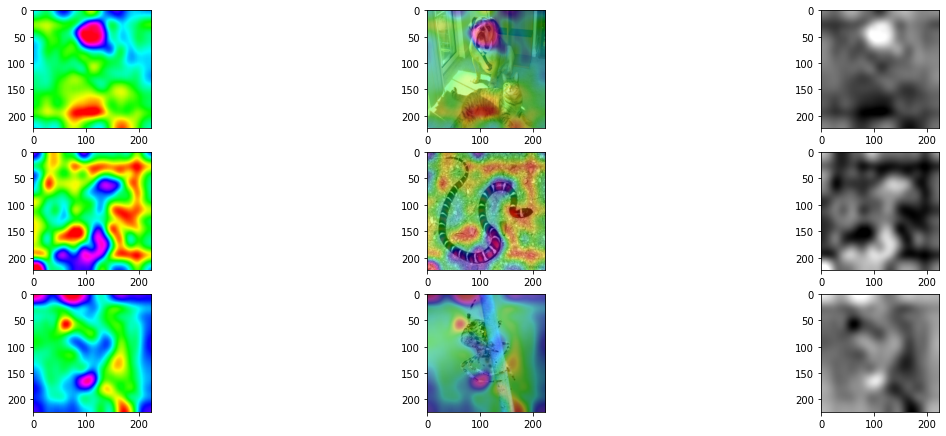

In [ ]:
import glob
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

images = []
images2 = []
path = '/content/gdrive/MyDrive/IMT Atlantique/Deep Learning/AttentionMap/Grad-CAM/pytorch-cnn-visualizations/results/Heat_Maps/*.png'
path2 = '/content/gdrive/MyDrive/IMT Atlantique/Deep Learning/AttentionMap/Grad-CAM/pytorch-cnn-visualizations/results/RG/*.png'
files = glob.glob(path)


for img_path in glob.glob(path):
    images.append(mpimg.imread(img_path))

for img_path2 in glob.glob(path2):    
    images2.append(mpimg.imread(img_path2))

plt.figure(figsize=(20,10))
columns = 4

columns2 = 3
for i, image2 in enumerate(images2):
    plt.subplot(len(images2) / columns2 + 1, columns2, i + 1)
    plt.imshow(image2)





In the previous image we can see how by entering three images you can extract the heat map, the grayscale image and finally the heat map on the image. We used alexnet, with labels taken from imagenet .

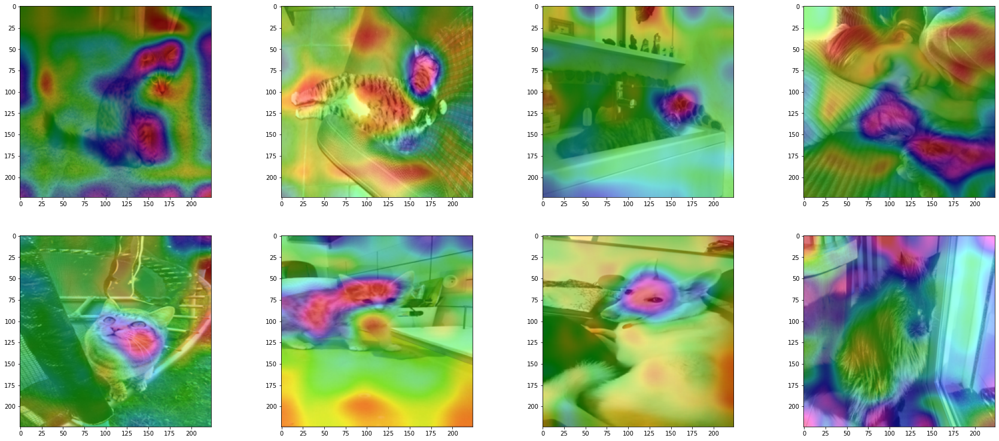

In [ ]:
plt.figure(figsize=(30,20))
columns = 4

for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)

The model looks at the face of the dogs and cats to classify them correctly, while I am unsure about the cat. However, in some images the detection of the class is not so clear. Also we can say thet the model is classifying the images as cats by looking at the ears, paws and whiskers. 

One possible reason for the misclassification and that it is not so clear is that, since we have not adjusted the pre-trained alexnet model in our cat and dog dataset, CNN as a feature extractor is not at all familiar with the patterns of the images that appear in our dataset.

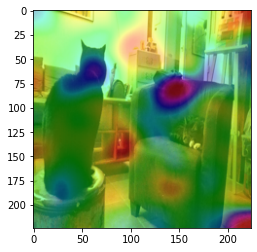

In [ ]:
img=mpimg.imread('./results/15_Cam_On_Image.png')
imgplot = plt.imshow(img)
plt.show()

When multiple instances of the same class are present in the image, the model looks only at one of them, is more difficult to classify when there are multiple objects, this may also be due to the error described above. 

# Conclusion

Class Activation Maps and Grad-CAMs are a few approaches that introduce some explainability/interpretability into deep learning models, and are quite widely used. What’s most interesting about these techniques is the ability to perform the object localization task, even without training the model with a location prior. When grad-cam used for a Visual task, it can help us understand why the model came to a particular answer. Even though Grad-CAM is class-discriminative and localizes the relevant image regions, it lacks the ability to highlight fine-grained details the way pixel-space gradient visualization methods do.